## Introduction

Whether you are a wandering traveler visiting, a businessperson working abroad, or a local recommending lodging in a new city, societies perception towards temporary housing has been altered since Airbnb’s inception. Airbnb was founded in 2008 in San Francisco, USA. The company provides an online platform to connect individuals (customers) looking for temporary lodging accommodations to other individuals (investors) willing to rent out their homes within a specific city around the world. The optionality provided through this online platform has contributed to the sharing economy while competing heavily with the hotel industry around the world (Folger, 2023). Through its development over the years, Airbnb has been able to provide many individuals with a personable “local” experience while also potentially being a more affordable lodging option for many. According to Hollander (2022) it was estimated that Airbnb was already capturing between 10% to 12% of the travel demand in major cities around the world including New York, USA and London, England.

As the popularity of Airbnb increases and a variety of short-term and long-term rental options become available, the need to improve customer and investor decision-making is becoming increasingly important. To address this problem, we’ve decided to complete our course team project on the matter with the data focused specifically on London, England. According to Curry (2023) London is considered one of the five major cities for Airbnb usage and throughout this data visualization project, we will uncover trends to highlight the different variables that will be useful in decision-making when either hosting or renting on Airbnb.

We will consider three perspectives in our guiding questions. Those perspectives are (1) the customer’s perspective, (2) the investor’s (or landlord’s) perspective and the (3) local/external perspective. The guiding questions are:

1. Where are the tourist hotspots? (local perspective)

2. What factors affect demand of Airbnb units? (investor's perspective)

3. What factors drive up prices for Airbnb units? (customer's perspective)

## Data Cleaning and Wrangling

,id,latitude,longitude,accommodates,bedrooms,beds,Price.mod,minimum_nights_avg_ntm,maximum_nights_avg_ntm,number_of_reviews,review_scores_rating,review_scores_accuracy,review_scores_cleanliness,review_scores_checkin,review_scores_communication,review_scores_location,review_scores_value,reviews_per_month,Rev
count,4.451500e+04,44515.000000,44515.000000,44515.000000,44515.000000,44515.000000,44515.000000,44515.000000,4.451500e+04,44515.000000,44515.000000,44515.000000,44515.000000,44515.000000,44515.000000,44515.000000,44515.000000,44515.000000,44515.000000
mean,4.182043e+17,51.509168,-0.130166,3.290194,1.160463,1.871504,170.592003,6.992200,8.325765e+05,28.555004,4.652852,4.695754,4.632823,4.764285,4.784034,4.718918,4.568155,1.338877,3889.741795
std,4.043670e+17,0.048329,0.101258,2.017454,1.178281,1.317392,169.765204,23.298702,4.203224e+07,54.178875,0.516534,0.498073,0.516238,0.455434,0.455081,0.409949,0.536435,1.471762,8580.154409
min,1.391300e+04,51.295937,-0.497800,1.000000,0.000000,1.000000,25.000000,1.000000,1.000000e+00,1.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,1.000000,0.010000,25.000000
25%,3.189376e+07,51.484890,-0.190736,2.000000,0.000000,1.000000,74.000000,1.900000,3.650000e+02,3.000000,4.530000,4.620000,4.500000,4.730000,4.760000,4.630000,4.440000,0.380000,429.000000
50%,5.950000e+17,51.513224,-0.129900,2.000000,1.000000,1.000000,126.000000,2.900000,9.004000e+02,10.000000,4.810000,4.860000,4.790000,4.920000,4.940000,4.830000,4.710000,0.900000,1320.000000
75%,8.250000e+17,51.537511,-0.070652,4.000000,2.000000,2.000000,200.000000,4.300000,1.125000e+03,30.000000,5.000000,5.000000,5.000000,5.000000,5.000000,5.000000,4.900000,1.790000,3864.000000
max,9.720000e+17,51.681502,0.295731,16.000000,50.000000,50.000000,1570.000000,999.000000,2.147484e+09,1536.000000,5.000000,5.000000,5.000000,5.000000,5.000000,5.000000,5.000000,50.250000,352152.000000


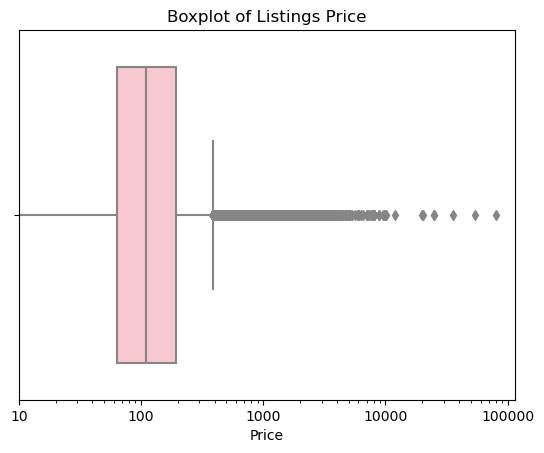

In [47]:
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import plotly.express as px
import seaborn as sns
from wordcloud import WordCloud


df_listings = pd.read_csv('Detailed Listing.csv', low_memory = False) #read table

df_listings = df_listings.drop(['listing_url','host_url', 'last_scraped', 'scrape_id','source','description', 'picture_url', 'minimum_nights', 'maximum_nights', 'minimum_minimum_nights', 'maximum_minimum_nights', 'minimum_maximum_nights', 'maximum_maximum_nights', 'calendar_updated',
                                'has_availability','availability_30', 'availability_60', 'availability_90', 'availability_365', 'host_picture_url', 'host_verifications','host_has_profile_pic', 'host_identity_verified', 'number_of_reviews_l30d', 'host_thumbnail_url',
                                'license', 'bathrooms', 'calculated_host_listings_count_entire_homes', 'calculated_host_listings_count_private_rooms','calculated_host_listings_count_shared_rooms', 'first_review', 'last_review', 'calendar_last_scraped' ,'neighbourhood_group_cleansed','host_name','name','neighbourhood',
                               'neighborhood_overview', 'number_of_reviews_ltm', 'host_about'], axis = 1) #drops columns not being used

df_listings.rename(columns = {'bathrooms_text': 'bathrooms'}, inplace = True) #rename relevant colums


df_listings['bedrooms'].fillna(0, inplace = True) #fill in the na values
df_listings['bedrooms'].fillna('0', inplace = True) #fill in the na values
df_listings['host_location'].fillna('Unknown', inplace = True) #fill in the na values
df_listings['host_neighbourhood'].fillna('Unknown', inplace = True) #fill in the na values


#Applying the dataset into a data frame
df_listings = pd.DataFrame(df_listings)


#code to modify price into a column we can use for calculations
df_listings['price'] = df_listings['price'].str.replace('$','', regex = False)
df_listings['price'] = df_listings['price'].str.replace(',','', regex = False)
df_listings['Price.mod'] = df_listings['price'].astype(float)


# Boxplot for distribution of price
b = sns.boxplot(x=df_listings['Price.mod'], color='pink') 
b.set_xscale("log")
custom_xticks = [10, 100, 1000, 10000, 100000]
custom_xlabels = ['10', '100', '1000', '10000', '100000']

b.set_xticks(custom_xticks)
b.set_xticklabels(custom_xlabels)

b.set(xlabel = 'Price', title = 'Boxplot of Listings Price')


#code required to take out the blanks and restructure the dataset
df_listings = df_listings[df_listings['host_response_rate'].notna()]
df_listings = df_listings[pd.notnull(df_listings['host_acceptance_rate'])]
df_listings = df_listings[pd.notnull(df_listings['host_is_superhost'])]
df_listings = df_listings.dropna()


#code required for trimming the table based on the listing price
top_threshold = df_listings['Price.mod'].quantile(0.995)
bot_threshold = df_listings['Price.mod'].quantile(0.005)


df_listings = df_listings[df_listings['Price.mod'] <= top_threshold]
df_listings = df_listings[df_listings['Price.mod'] >= bot_threshold]


#Breaks down one table into two tables for stakeholders and rental property listed
stk_desc = df_listings.filter(items = ['id','host_id','host_since','host_location','Price.mod','host_response_time','host_response_rate','host_acceptance_rate','host_is_superhost','host_neighbourhood','host_listings_count','host_total_listings_count','calculated_host_listings_count','accommodates'])


list_desc = df_listings.filter(items =['id','neighbourhood_cleansed','latitude','longitude','property_type','room_type','accommodates', 'bathrooms', 'bedrooms',
                        'beds', 'amenities','price','Price.mod', 'minimum_nights_avg_ntm','maximum_nights_avg_ntm','number_of_reviews',
                        'review_scores_rating', 'review_scores_accuracy', 'review_scores_cleanliness', 'review_scores_checkin', 'review_scores_communication','review_scores_location',
                        'review_scores_value', 'instant_bookable','reviews_per_month'])


#response rate and acceptance rate amended to convert it into a float 
stk_desc['host_response_rate'] = stk_desc ['host_response_rate'].str.rstrip('%').astype('float') / 100.0
stk_desc['host_acceptance_rate'] = stk_desc ['host_acceptance_rate'].str.rstrip('%').astype('float') / 100.0

#revenue column created
list_rev = list_desc['price'] * list_desc['number_of_reviews']

list_desc['Rev'] = list_desc['Price.mod'] * list_desc['number_of_reviews'] # to be modified 
list_desc = list_desc.sort_values( by = 'Price.mod', ascending = True)

#creating two tables summarizing the relevant statistics
stk_stats = stk_desc.filter(items = ['host_response_rate','host_acceptance_rate','host_listings_count','host_total_listings_count','calculated_host_listings_count']).describe(include=[np.number], exclude = [object]) # Summary Statistics for the host
list_stats = list_desc.query('Rev > 0').describe(include=[np.number], exclude = [object]) # Summary Statistics for the listing properties



stk_stats
list_stats




## Data cleaning and wrangling : Amenities

In [2]:
print("Number of records of main cleaned dataframe:", len(list_desc))

Number of records of main cleaned dataframe: 44515


In [3]:
# We created a new  dataframe only with the necessary columns: listing id and amenities

df_amenities_aux = list_desc[['id', 'amenities']]
print("Number of records of new amenities dataframe:", len(df_amenities_aux))

# To know how many characters the largest column has we verified the maximum length:

max_chars = max(df_amenities_aux['amenities'].str.len())
print("The largest column has" , max_chars , "characters")

# To verify some values, we are extending the number of characters to 2000 for the first 5 rows:

for i in range(5):
    print(df_amenities_aux['amenities'].iloc[i][:max_chars])

# References
# Unicode character ’en dash’(U+2013). (n.d.). Retrieved 6 October 2023, from https://www.fileformat.info/info/unicode/char/2013/index.htm
# Answer to ‘python 3—Encode/decode vs bytes/str’. (2013, January 23).Retrieved 6 October 2023,Stack Overflow. https://stackoverflow.com/a/14474887

# We noticed this type of strings :\u2013. We searched and found are unicode characters.
# The following code will decode these strings for every row

for index, row in df_amenities_aux.iterrows():
    df_amenities_aux.loc[index, 'amenities'] = bytes(row['amenities'], 'utf-8').decode('unicode_escape')

# References
# Remove the non utf-8 characters from a String in Python | bobbyhadz. (n.d.). Retrieved 8 October 2023, from https://bobbyhadz.com/blog/python-remove-non-utf-8-characters-from-string
# When trying to count the number of listings for each amenity, an utf-8 error appeared so we removed non utf-8 characters

for index, row in df_amenities_aux.iterrows():
    df_amenities_aux.loc[index, 'amenities'] = row['amenities'].encode('utf-8', 'ignore').decode('utf-8')

Number of records of new amenities dataframe: 44515
The largest column has 2146 characters
["Hot water kettle", "Dryer", "Microwave", "Coffee maker", "Self check-in", "High chair", "TRESemm\u00e9 conditioner", "Hot water", "Iron", "First aid kit", "Neff  stainless steel gas stove", "Bidet", "Lockbox", "Free washer \u2013 In building", "Cooking basics", "Heating", "Dishwasher", "Shower gel", "Free street parking", "Children\u2019s books and toys", "Oven", "Refrigerator", "TV", "Hair dryer", "Essentials", "TRESemm\u00e9 shampoo", "Backyard", "Toaster", "Wifi", "Dishes and silverware", "Smoke alarm", "Kitchen", "Hangers", "Dedicated workspace"]
["Wifi", "Free parking on premises", "Smoking allowed", "Kitchen", "Smoke alarm", "Washer"]
["Bathtub", "Heating", "Hot water", "Iron", "Carbon monoxide alarm", "Host greets you", "Lock on bedroom door", "Wifi", "Shampoo", "Private living room", "Smoke alarm", "Dryer", "Kitchen", "Washer", "Cleaning available during stay", "Hair dryer", "Long term 

In [4]:
# We will remove the character '['

for index, row in df_amenities_aux.iterrows():
    df_amenities_aux.loc[index, 'amenities'] = row['amenities'].replace('[', '')

# We will remove the character ']'

for index, row in df_amenities_aux.iterrows():
    df_amenities_aux.loc[index, 'amenities'] = row['amenities'].replace(']', '')

# We will remove the character '"'

for index, row in df_amenities_aux.iterrows():
    df_amenities_aux.loc[index, 'amenities'] = row['amenities'].replace('"', '')

# The column has upper and lower cases, so we will convert to lower case all the words

for index, row in df_amenities_aux.iterrows():
     df_amenities_aux.loc[index, 'amenities'] = row['amenities'].lower()

# We will create a new column with the total of amenities for each listing

df_amenities = df_amenities_aux.copy()

for index, row in df_amenities.iterrows():
    df_amenities.loc[index, 'total_amenities'] = len(df_amenities.loc[index, 'amenities'].split(', '))

# We will verify the value in the new column "total amenities"

for i in range(5):
    print(df_amenities['amenities'].iloc[i][:2000])
    print(df_amenities['total_amenities'].iloc[i])



hot water kettle, dryer, microwave, coffee maker, self check-in, high chair, tresemmé conditioner, hot water, iron, first aid kit, neff  stainless steel gas stove, bidet, lockbox, free washer – in building, cooking basics, heating, dishwasher, shower gel, free street parking, children’s books and toys, oven, refrigerator, tv, hair dryer, essentials, tresemmé shampoo, backyard, toaster, wifi, dishes and silverware, smoke alarm, kitchen, hangers, dedicated workspace
34.0
wifi, free parking on premises, smoking allowed, kitchen, smoke alarm, washer
6.0
bathtub, heating, hot water, iron, carbon monoxide alarm, host greets you, lock on bedroom door, wifi, shampoo, private living room, smoke alarm, dryer, kitchen, washer, cleaning available during stay, hair dryer, long term stays allowed, fire extinguisher, essentials
19.0
bathtub, hot water kettle, shampoo, microwave, bed linens, blender, hot water, iron, host greets you, washer, portable fans, cooking basics, heating, drying rack for clot

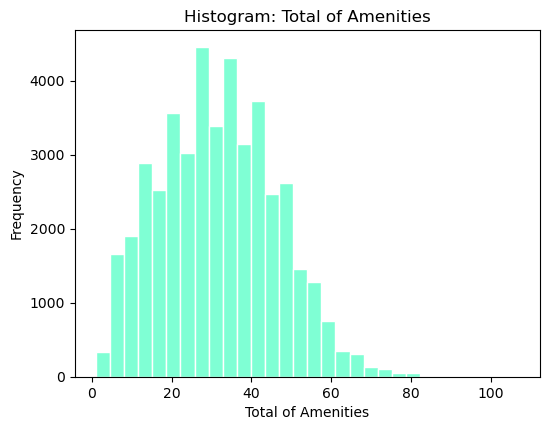

In [5]:
plt.figure(figsize=(6, 4.5))
plt.hist(df_amenities['total_amenities'], bins=30, color='aquamarine', edgecolor='white')
plt.xlabel('Total of Amenities')
plt.ylabel('Frequency')
plt.title('Histogram: Total of Amenities')
plt.show()

Inference: 

The mean is slightly greater than the median and as we can confirm with the histogram, the distribution is slightly right-skewed.

Adding one standard deviation to the median, we can consider that approximately 84% of the listings have maximum 46 amenities in total.

In [6]:
mean_value = round(np.mean(df_amenities['total_amenities']))
median_value = round(np.median(df_amenities['total_amenities']))
std_deviation = round(np.std(df_amenities['total_amenities']))

print("The mean of the total of amenities is:", mean_value)
print("The median of the total of amenities is:", median_value)
print("The standard deviation of the total of amenities is:", std_deviation)

The mean of the total of amenities is: 32
The median of the total of amenities is: 31
The standard deviation of the total of amenities is: 15


In [7]:
# References
# Python List extend method | How & When to use? (With code). (n.d.). FavTutor. Retrieved 7 October 2023, from https://favtutor.com/blogs/python-extend-list

# We will create a list of all the unique values of the amenities

amenities_list_unique = []

for row in df_amenities['amenities']:
    elements = row.split(', ')
    amenities_list_unique.extend(elements)

amenities_list_unique = list(set(amenities_list_unique))

print("The number of unique amenities is:", len(amenities_list_unique))

The number of unique amenities is: 5939


In [8]:
# We will create a function to create a dataframe with the number of listings for each amenity.

def func_total_listings(df_var):

    df_var_new = df_var.copy()
    df_var_new.loc[:, 'amenity'] = df_var_new['amenities'].str.split(', ')
    dict_aux_count = {}

    for index, row in df_var_new.iterrows():
        for amenity_val in row['amenity']:
            if amenity_val in dict_aux_count:
                dict_aux_count[amenity_val] += 1
            else:
                dict_aux_count[amenity_val] = 1

    col_values = list(dict_aux_count.items())
    df_total_listings = pd.DataFrame( col_values  , columns=['amenity', 'total_listings'])
    return df_total_listings

df_total_listings = func_total_listings(df_amenities)

max_amenities = median_value + std_deviation
sorted_df = df_total_listings.sort_values(by='total_listings', ascending=False).reset_index(drop=True)
top_amenities = sorted_df.head(max_amenities)

In [9]:
top_amenities.head(10)

,amenity,total_listings
0,smoke alarm,41610
1,kitchen,40363
2,wifi,39840
3,essentials,38865
4,iron,35249
5,hot water,34910
6,hangers,34386
7,hair dryer,33964
8,dishes and silverware,33872
9,carbon monoxide alarm,32569


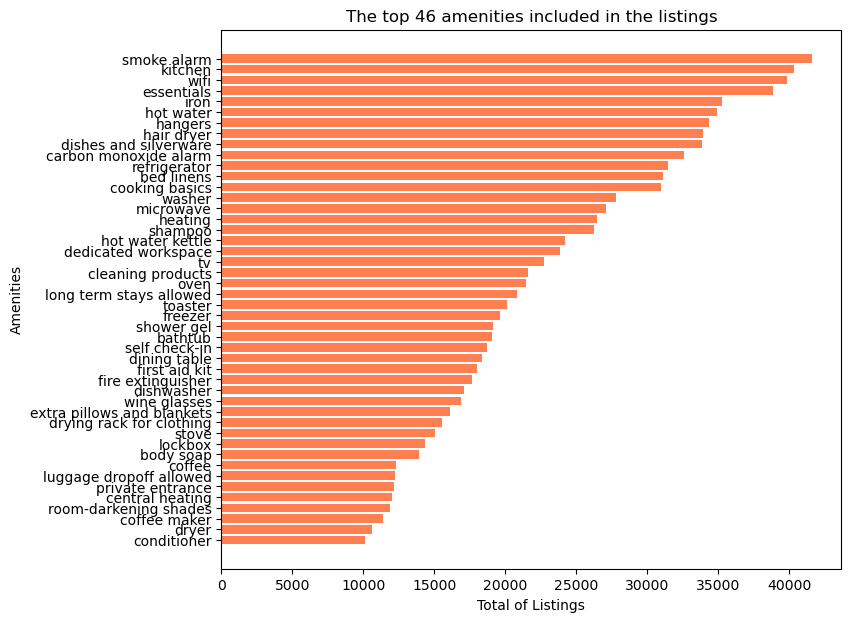

In [10]:
fig, ax = plt.subplots(figsize=(8, 7))
plt.barh(top_amenities['amenity'],top_amenities['total_listings'],height=0.8,color='coral')
plt.yticks(top_amenities['amenity'])
ax.invert_yaxis()
plt.xlabel('Total of Listings')
plt.ylabel('Amenities')
plt.title('The top ' +  str(max_amenities) + ' amenities included in the listings')
plt.show()

In [11]:
# We will create a column for each amenity in the top_amenities

df_amenities_col = pd.DataFrame(columns=['id'] + list(top_amenities['amenity']))
df_amenities_col.head()

,id,smoke alarm,kitchen,wifi,essentials,iron,hot water,hangers,hair dryer,dishes and silverware,...,lockbox,body soap,coffee,luggage dropoff allowed,private entrance,central heating,room-darkening shades,coffee maker,dryer,conditioner


In [12]:
%%time
amenity_columns = {amenity: [] for amenity in top_amenities['amenity']}

for index, row in df_amenities.iterrows():
    amenities_list = row['amenities'].split(', ')
    for amenity in top_amenities['amenity']:
        amenity_columns[amenity].append(1 if amenity in amenities_list else 0)

amenity_columns['id'] = df_amenities['id']

df_amenities_col = pd.DataFrame(amenity_columns)

CPU times: total: 859 ms
Wall time: 2.08 s


In [13]:
df_amenities_col.head(5)

,smoke alarm,kitchen,wifi,essentials,iron,hot water,hangers,hair dryer,dishes and silverware,carbon monoxide alarm,...,body soap,coffee,luggage dropoff allowed,private entrance,central heating,room-darkening shades,coffee maker,dryer,conditioner,id
38603,1,1,1,1,1,1,1,1,1,0,...,0,0,0,0,0,0,1,1,0,4.101709e+07
71637,1,1,1,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,8.720000e+17
28852,1,1,1,1,1,1,0,1,0,1,...,0,0,0,0,0,0,0,1,0,2.973541e+07
35567,1,1,1,1,1,1,1,0,1,0,...,1,0,0,0,0,0,0,0,1,3.786481e+07
41329,1,1,0,1,1,1,1,1,1,1,...,1,1,1,1,0,0,0,0,1,4.464466e+07


In [14]:
df_amenities_col = df_amenities_col.astype(int)
df_amenities_col.info()

<class 'pandas.core.frame.DataFrame'>
Int64Index: 44515 entries, 38603 to 43672
Data columns (total 47 columns):
 #   Column                      Non-Null Count  Dtype
---  ------                      --------------  -----
 0   smoke alarm                 44515 non-null  int32
 1   kitchen                     44515 non-null  int32
 2   wifi                        44515 non-null  int32
 3   essentials                  44515 non-null  int32
 4   iron                        44515 non-null  int32
 5   hot water                   44515 non-null  int32
 6   hangers                     44515 non-null  int32
 7   hair dryer                  44515 non-null  int32
 8   dishes and silverware       44515 non-null  int32
 9   carbon monoxide alarm       44515 non-null  int32
 10  refrigerator                44515 non-null  int32
 11  bed linens                  44515 non-null  int32
 12  cooking basics              44515 non-null  int32
 13  washer                      44515 non-null  int32
 14  mi

C:\Users\afree\anaconda3\Lib\site-packages\pandas\core\dtypes\astype.py:189: RuntimeWarning: invalid value encountered in cast
  return values.astype(dtype, copy=copy)


In [15]:
# References
# Pandas. Dataframe. Merge—Pandas 2. 1. 1 documentation. (n.d.). Retrieved 7 October 2023, from https://pandas.pydata.org/docs/reference/api/pandas.DataFrame.merge.html

# We joined the new amenities dataframe with the main dataframe to be able to analize the amenities with the other variables

df_desc_list = list_desc.merge(df_amenities_col, on='id', how='inner')

C:\Users\afree\AppData\Local\Temp\ipykernel_23164\2071119892.py:6: UserWarning: You are merging on int and float columns where the float values are not equal to their int representation.
  df_desc_list = list_desc.merge(df_amenities_col, on='id', how='inner')


In [16]:
df_desc_list.head()

,id,neighbourhood_cleansed,latitude,longitude,property_type,room_type,accommodates,bathrooms,bedrooms,beds,...,lockbox,body soap,coffee,luggage dropoff allowed,private entrance,central heating,room-darkening shades,coffee maker,dryer,conditioner
0,41017088.0,Redbridge,51.57670,0.07628,Private room in home,Private room,1,3.5 shared baths,0.0,1.0,...,1,0,0,0,0,0,0,1,1,0
1,29735407.0,Waltham Forest,51.56905,-0.03429,Private room in home,Private room,2,1 shared bath,0.0,1.0,...,0,0,0,0,0,0,0,0,1,0
2,37864812.0,Enfield,51.61960,-0.07930,Private room in condo,Private room,1,1.5 shared baths,0.0,1.0,...,0,1,0,0,0,0,0,0,0,1
3,44644658.0,Islington,51.54865,-0.12402,Private room in townhouse,Private room,1,1.5 shared baths,0.0,1.0,...,1,1,1,1,1,0,0,0,0,1
4,2087417.0,Haringey,51.58680,-0.08643,Private room in home,Private room,1,1 bath,0.0,1.0,...,0,0,0,0,0,0,0,0,0,0


## Local's Perspective

#### GUIDING QUESTION #1 - WHAT ARE THE TOURIST HOTSPOTS ?

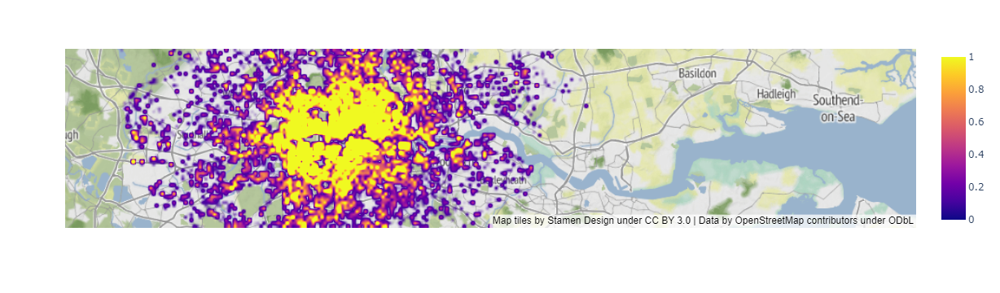

In [17]:
# Heat map displaying the tourist hotspots
import plotly.express as px
fig = px.density_mapbox(list_desc, lat="latitude", lon="longitude", radius=2,
                        center=dict(lat=51.5072, lon=0.1276 ), zoom=9,
                        mapbox_style="stamen-terrain")
fig.show()

This heat map displays the density of listings in London. When zoomed out, it is clear that most of the listings are in the center of the city and they get more sparse and spread out as we move out of the city center. Zooming into the center of the map, we can see that neighbourhoods around Hyde Park and Kensington Gardens are quite dense as these are tourist attractions and there are other popular attractions in the area as well. The same can be said for Westminster where many attractions such as the Buckingham Palace and the London Eye.

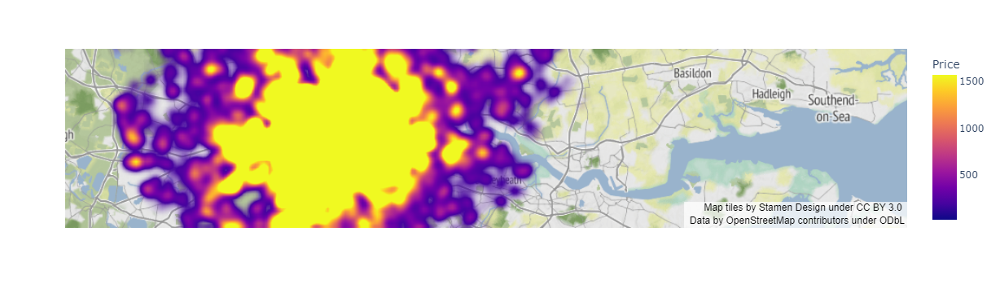

In [18]:
# Listings by price
temp_df = list_desc.copy()
temp_df.rename(columns={"Price.mod":"Price"}, inplace=True)

fig = px.density_mapbox(temp_df, lat="latitude", lon="longitude", z="Price", radius=15,
                        center=dict(lat=51.5072, lon=0.1276 ), zoom=9,
                        mapbox_style="stamen-terrain")

fig.show()

This heat map displays density of listings colored by the nightly rate. A similar pattern can be seen where the more expensive units are concentrated in the center of the city and get less expensive towards the city's borders although there are some exceptions. Zooming in, we see that the tourist hotspots like Westminster and Kensington we found in the previous visualization also tend to have the more expensive listings. Generally, the pattern seems to be that expensive listings are more likely to be found in popular tourist ares.

In [19]:
temp_df = list_desc
temp_df['superhost_status'] = stk_desc.host_is_superhost.values # Use temporary dataframe to hold superhost status and neighbourhood variables

neighbourhood_counts = temp_df.groupby(['neighbourhood_cleansed', 'superhost_status']).size().reset_index(name='listing_count') 
superhost_mapping = {'t': 'Superhost', 'f' : 'Non-superhost'}

neighbourhood_counts['superhost_status'] = neighbourhood_counts['superhost_status'].map(superhost_mapping)

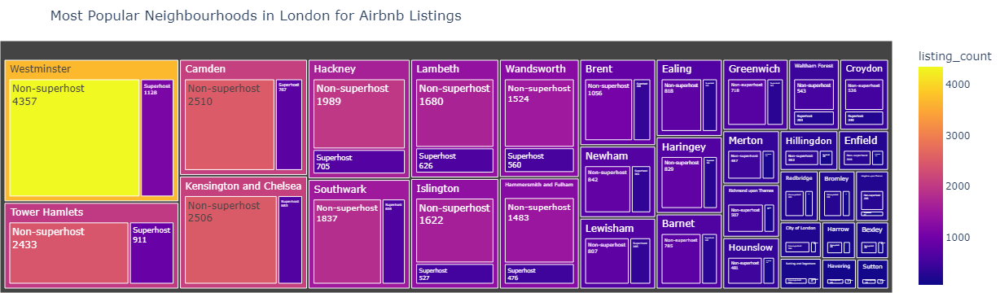

In [20]:
fig = px.treemap(neighbourhood_counts,
                 path=['neighbourhood_cleansed', 'superhost_status'],
                 values='listing_count',
                 color='listing_count',
                 color_continuous_scale='Plasma',
                 title='Most Popular Neighbourhoods in London for Airbnb Listings')
fig.update_traces(textinfo='label+value', selector=dict(type='treemap'))
fig.update_layout(margin=dict(t=50, l=0, r=0, b=0))
fig.show()

This treemap shows the neighbourhoods more explicitly so that we can properly rank the popularity of each neighbourhood by number of Airbnb listings. We see results similar to those in the heatmap. Westminster has the most Airbnb listings because of its proximity to tourist attractions. The breakdown of superhost status is included for each area and this shows us that the ratio of superhosts to non-superhosts stays mostly consistent throughout. This is mostly expected considering that superhost status is something exclusive. Although, we might not have expected as many superhosts in less popular areas. 

## Investor's Perspective

#### GUIDING QUESTION #2 - WHAT FACTORS AFFECT DEMAND ?

In [50]:
#The visualization for average nightly price based on type of property.
# import numpy as np
# import pandas as pd
# import matplotlib.pyplot as plt

roomtype = list_desc['room_type']
price = list_desc['Price.mod']
n  = len(roomtype)
privatenum = 0
entirenum = 0
hotelnum = 0
sharednum = 0
i  = 0
privprice = 0
entireprice = 0
hotelprice = 0
sharedprice = 0

# print(price.iloc[0])

while (i < n):
    
    if (roomtype.iloc[i] == 'Private room'):
        privatenum  = privatenum + 1
        privprice = privprice + price.iloc[i]
        i = i + 1


    elif (roomtype.iloc[i] == 'Entire home/apt'):
        entirenum = entirenum + 1
        entireprice = entireprice + price.iloc[i]
        i = i + 1


    elif (roomtype.iloc[i] == 'Hotel room'):
        hotelnum = hotelnum + 1
        hotelprice = hotelprice + price.iloc[i]
        i = i + 1


    elif (roomtype.iloc[i] == 'Shared room'):
        sharednum = sharednum + 1
        sharedprice = sharedprice + price.iloc[i]
        i = i + 1


paveragepriv = privprice/privatenum
paverageentire = entireprice/entirenum
paveragehotel = hotelprice/hotelnum
paverageshared = sharedprice/sharednum
avelist = [paveragepriv, paverageentire, paveragehotel, paverageshared]
avesort  = sorted(avelist)

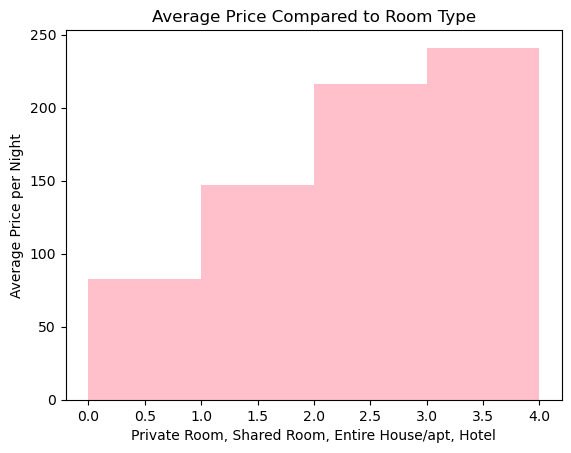

In [51]:
plt.xlabel('Private Room, Shared Room, Entire House/apt, Hotel')
plt.ylabel('Average Price per Night')
plt.title('Average Price Compared to Room Type')
plt.stairs(values = (avesort), fill=True,color='pink')
plt.show()

The inference for this graph is simple, it is just serving as a reccommendation to investors as to which properties they should own/invest in for the sake of making the most money for rent. From the above, we can see that those who own entire houses or apartments which they can rent out are in the best position for charging more to their tennents. 

In [23]:
from matplotlib.pyplot import figure

price = list_desc['Price.mod']
neighbourhood = list_desc['neighbourhood_cleansed']
neighborhood_avg_price = list_desc.groupby("neighbourhood_cleansed")["Price.mod"].mean().reset_index()
neighbourhoodlist = pd.unique(neighbourhood)

datfrfinal = pd.DataFrame(
    {'Neighbourhood': neighbourhoodlist,
     'Average Price': neighborhood_avg_price["Price.mod"],
    })

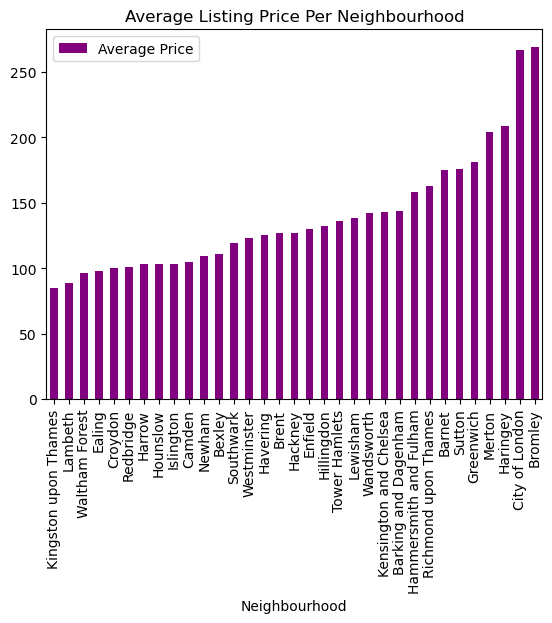

In [24]:
datfrfinal = datfrfinal.sort_values(by = ['Average Price'])
datfrfinal.plot.bar(x='Neighbourhood', y = 'Average Price', color="purple")
plt.title("Average Listing Price Per Neighbourhood")
plt.show()

This graph displays the overall average rent prices per the 33 bouroughs of London. As we can see there is an association between downtown neighborhoods (City of London) and higher prices due to the proximity to more tourist attractions for visitors. Furthermore, within the more affluent neighbourhoods (Bromley, which is more towards the outskirts), we also see an increase in price as it is a generally more expensive area to live. 

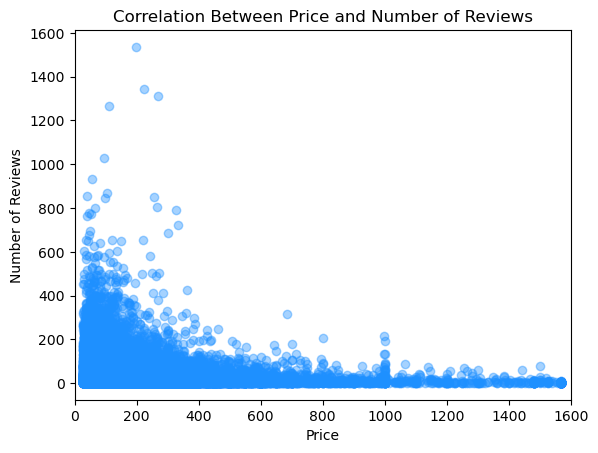

In [25]:
#Number of Reviews
price = list_desc['Price.mod']
reviews = list_desc['number_of_reviews']
pricelen = len(price)
pricelen = pricelen - 1
i = 0

plt.scatter(price, reviews, c='dodgerblue', alpha=0.4)
plt.xlim(0, 1600)
plt.xlabel('Price')
plt.ylabel('Number of Reviews')
plt.title("Correlation Between Price and Number of Reviews")

plt.show()

For this above scatter plot, because we had to utilize reviews as a proxy for demand of specific airbnb locations, we get a glimpse into how investors might want to make the most money. Along the left side of the graph, we see some very high number of reviews along the left side along with cheaper prices. As an investor, I would infer that the best option for an Airbnb investment property would be to keep prices low to assure frequent visits and a consistent influx of revenue. Furthermore, as explained previously, superhosts are allowed charge more to people who stay on their property, meaning that the best option would be to keep your property at a cheap price to assure many visits and lots of stays, such that later on your superhost status can bring in a further influx of revenue. 

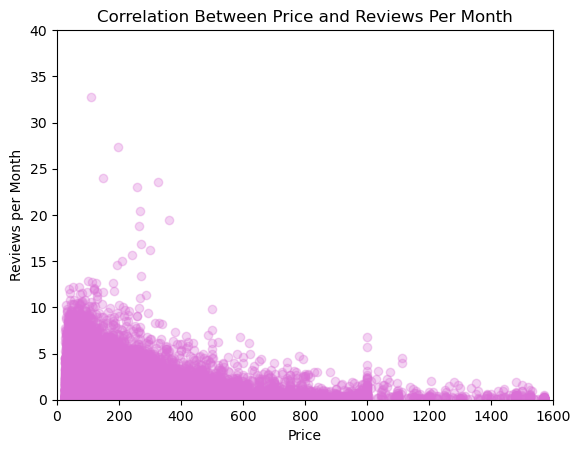

In [26]:
price = list_desc['Price.mod']
reviews = list_desc['reviews_per_month']
pricelen = len(price)
pricelen = pricelen - 1

i = 0

plt.scatter(price, reviews, c='orchid', alpha=0.3)
plt.xlim(0, 1600)
plt.ylim(0,40)
plt.xlabel('Price')
plt.ylabel('Reviews per Month')
plt.title("Correlation Between Price and Reviews Per Month")

plt.show()

Same inferences for this graph as the previous, it is essentially the same as above except for that it is per month rather than overall (just a different form of visualization). 

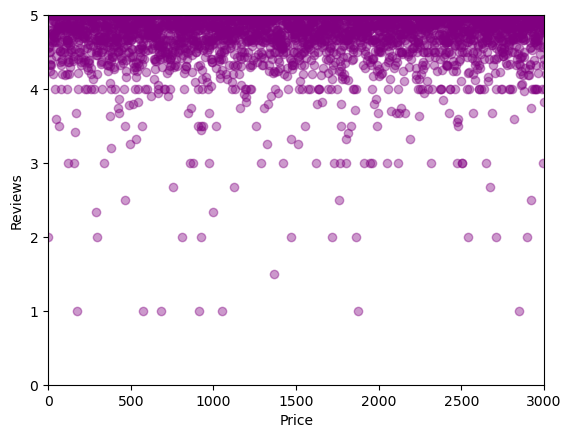

In [27]:
price = list_desc['price']
ratings = list_desc['review_scores_rating']

 

plt.scatter( list(range(0,len(ratings))), ratings, color="purple", alpha=0.4)
plt.xlim(0, 3000)
plt.ylim(0,5)
plt.xlabel('Price')
plt.ylabel('Reviews')

 

plt.show()

From the above graph, although initially it looks like there is not a relation between ratings and price, there actually is. It shows that for Airbnbs, the more an individual charges for a nightly say, the closer their rating is to 1. Even though Airbnb ratings rarely go below 4, and most sit between 4 and 5, it appears that you are more likely to get a rating closer to 4 the more you charge per night. 

In [28]:
print(stk_desc.info())

<class 'pandas.core.frame.DataFrame'>
Int64Index: 44515 entries, 1 to 87733
Data columns (total 14 columns):
 #   Column                          Non-Null Count  Dtype  
---  ------                          --------------  -----  
 0   id                              44515 non-null  float64
 1   host_id                         44515 non-null  int64  
 2   host_since                      44515 non-null  object 
 3   host_location                   44515 non-null  object 
 4   Price.mod                       44515 non-null  float64
 5   host_response_time              44515 non-null  object 
 6   host_response_rate              44515 non-null  float64
 7   host_acceptance_rate            44515 non-null  float64
 8   host_is_superhost               44515 non-null  object 
 9   host_neighbourhood              44515 non-null  object 
 10  host_listings_count             44515 non-null  float64
 11  host_total_listings_count       44515 non-null  float64
 12  calculated_host_listings_count  

## Customer's Perspective

#### GUIDING QUESTION #3 - WHAT ARE THE HOST AND UNIT FEAUTURES THAT DRIVE UP LISTINGS PRICES ?

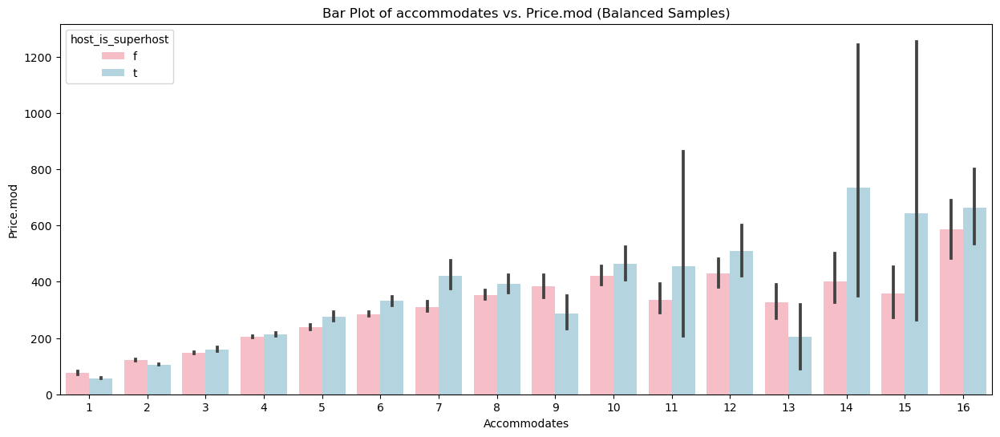

In [29]:
# Concatenate the samples into one DataFrame
colors = ['lightpink', 'lightblue']
# Set the color palette (using the 'deep' palette)
sns.set_palette(sns.color_palette(colors))

# Create a bar plot for the balanced samples
plt.figure(figsize=(15, 6))
sns.barplot(x='accommodates', y='Price.mod', hue='host_is_superhost', data=stk_desc)

# Set labels and title
plt.xlabel('Accommodates')
plt.ylabel('Price.mod')
plt.title('Bar Plot of accommodates vs. Price.mod (Balanced Samples)')

# Display the plot
plt.show()

The presented graph makes it evident that there is a demonstrable upward trend between a superhost's listing price and status. This implies that superhosts typically charge more for their listing than do regular hosts/non-superhost. The difference in pricing may be explained by the credibility and trust that superhosts enjoy because of their well-established track record of providing excellent service and they try to provide the best quality servics which in turn makes the listing a bit more expensive.For travelers on a tight budget looking for reasonably priced lodging, booking with a regular host could be the best alternative. It's conceivable that regular hosts will charge less for their listings. However, for those willing to invest a bit more for the assurance of a superior experience and the certainty of staying with a host renowned for outstanding service, booking a stay with a superhost becomes a worthwhile option. The additional cost is essentially an investment in the quality of service and the peace of mind that comes with a reputable and reliable host.

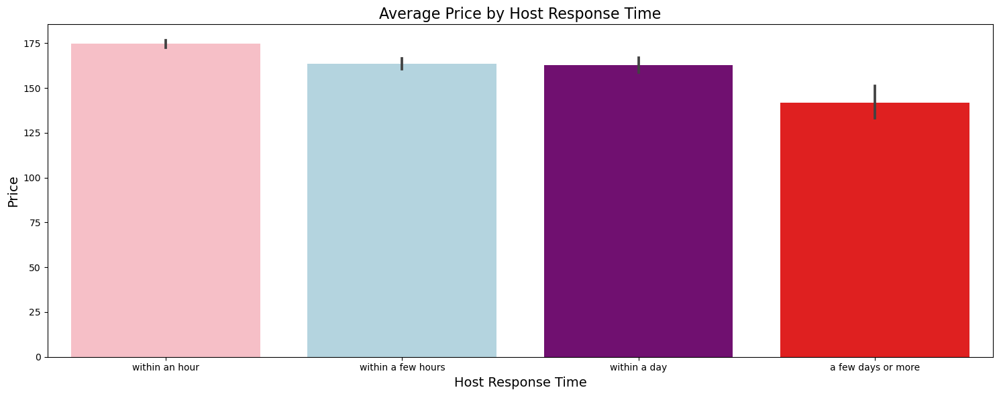

In [30]:
# Set a custom color palette
colors = ['lightpink', 'lightblue', 'purple', 'red']
sns.set_palette(sns.color_palette(colors))

# Create the bar plot
plt.figure(figsize=(15, 6))
data = ['within an hour', 'within a few hours', 'within a day', 'a few days or more']
sns.barplot(x='host_response_time', y='Price.mod', dodge=True, data=stk_desc, order=data)

# Customize labels and title
plt.xlabel('Host Response Time', fontsize=14)
plt.ylabel('Price', fontsize=14)
plt.title('Average Price by Host Response Time', fontsize=16)

# Show the plot
plt.tight_layout()
plt.show()

The data in the illustration shows a clear downward trend, meaning that listings with hosts who reply within a few hours typically have higher pricing than ones with hosts who wait several days to react. Superhosts could be responsible for this phenomena because they usually respond faster than regular hosts. Superhosts are motivated to respond to questions promptly because they are concerned about keeping their standing. Customers could derive important insights from this trend when deciding whether to book a listing from a superhost or a regular host.In conclusion, it is critical for customers to understand the benefits and drawbacks of booking a listing from a superhost as opposed to a regular host. Superhosts may have more expensive listings because of their quick response times. Nonetheless, a better customer service experience with rapid communication and issue resolution is frequently the result of this swift reaction. However, although frequent hosts' listings may be less expensive, they may also require a lengthier response time, which could cause the booking process to take a little longer. In order to ensure that they make an informed decision that meets their unique needs and expectations, customers should consider these variables in light of their preferences, budget, and urgency.

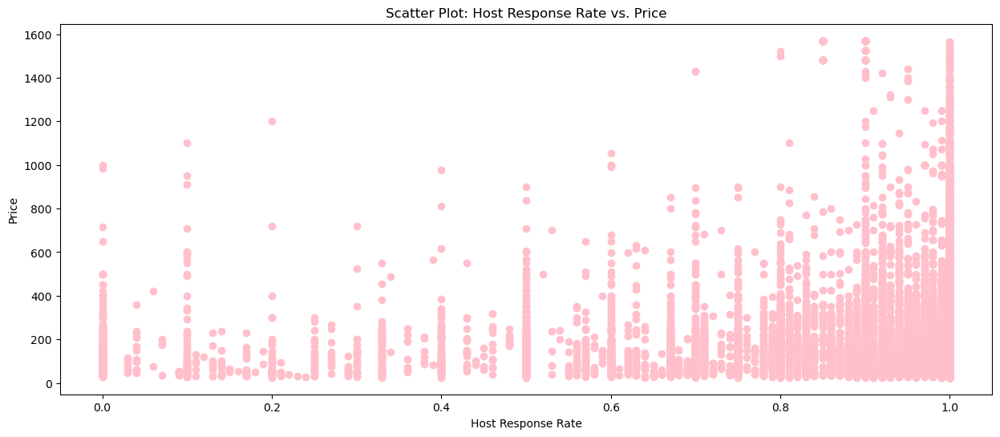

In [31]:

plt.figure(figsize=(15,6))
plt.scatter(stk_desc['host_response_rate'], stk_desc['Price.mod'],color='pink')
plt.xlabel('Host Response Rate')
plt.ylabel('Price')

plt.title('Scatter Plot: Host Response Rate vs. Price')
plt.show()

This graph indicates a growing trend: the price of the listing increases in parallel with a high host response rate.This relates to our earlier conclusion that it is most likely the result of superhosts, who must maintain a 90% response rate in order to maintain the title. It also could be the result of regular hosts attempting to meet the requirements in order to become superhosts, as that is one of the requirements.In this instance, our conclusion is comparable to the preceding graph. Customers should take into account these factors in light of their preferences, budget, and requirements and expectations to ensure that they make an informed decision that fulfills their specific needs and expectations.

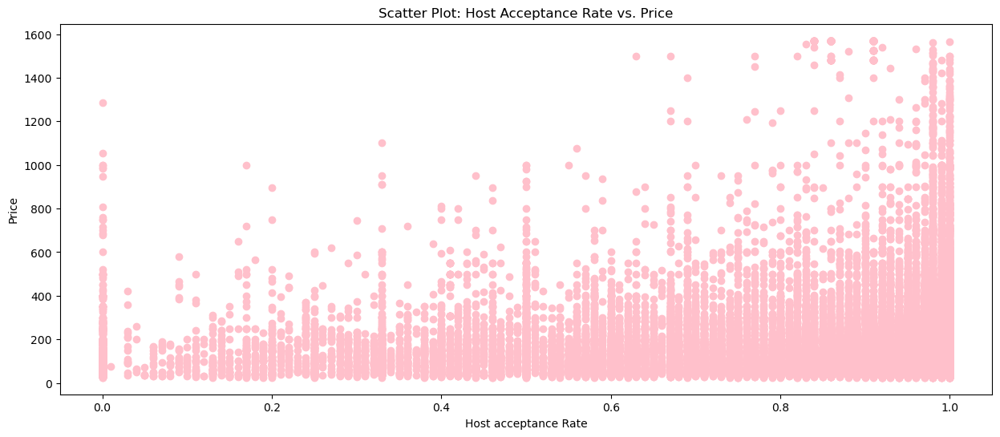

In [32]:
plt.figure(figsize=(15,6))
plt.scatter(stk_desc['host_acceptance_rate'], stk_desc['Price.mod'],color='pink')
plt.xlabel('Host acceptance Rate')
plt.ylabel('Price')

plt.title('Scatter Plot: Host Acceptance Rate vs. Price')
plt.show()

This graph shows a similar trend where listing price increases as host acceptance rate increases.superhosts and regualr hosts trying get the superhost title could be the cause of this as well as in order to maintain their title that need to host more than ten plus stays in the past year as well as is a requirement for a regular host to become a new super host.Therefore, if you urgently need a place to stay it's advisable to consider listings by superhosts. They are more likely to accept bookings promptly compared to regular hosts. However, it's important to note that these listings might come at a slightly higher price.

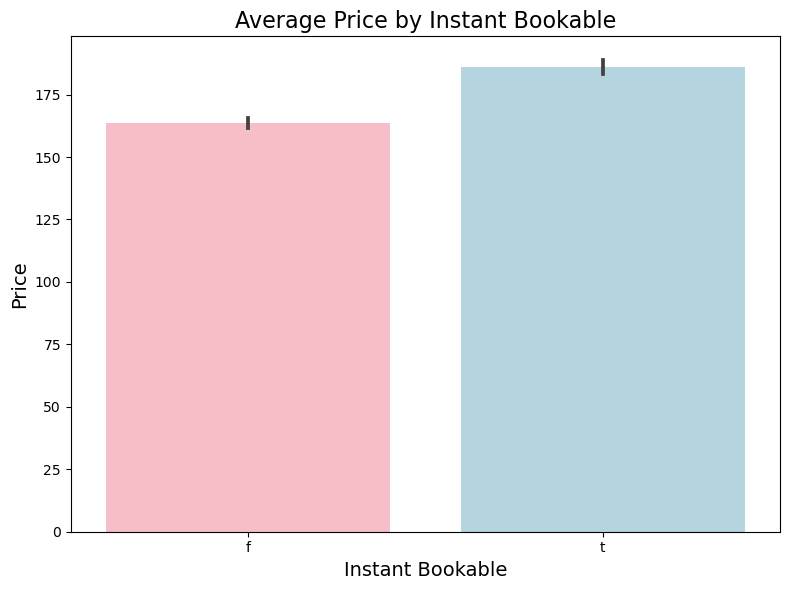

In [33]:
import seaborn as sns
import matplotlib.pyplot as plt

# Set a custom color palette and specify labels for the legend
colors = ['lightpink', 'lightblue']
sns.set_palette(sns.color_palette(colors))

# Create the bar plot
plt.figure(figsize=(8, 6))
sns.barplot(x='instant_bookable', y='Price.mod', data=list_desc, orient='v')

# Customize labels and title
plt.xlabel('Instant Bookable', fontsize=14)
plt.ylabel('Price', fontsize=14)
plt.title('Average Price by Instant Bookable', fontsize=16)

# Show the plot
plt.tight_layout()
plt.show()

By examining the graph above, we may observe that reservations with instant bookability typically have higher prices than those without.Superhosts are more likely to possess this trait since it can benefit them, as they are required to maintain a 90 percent host response rate.In this instance, the conclusion is comparable to the earlier graphs.

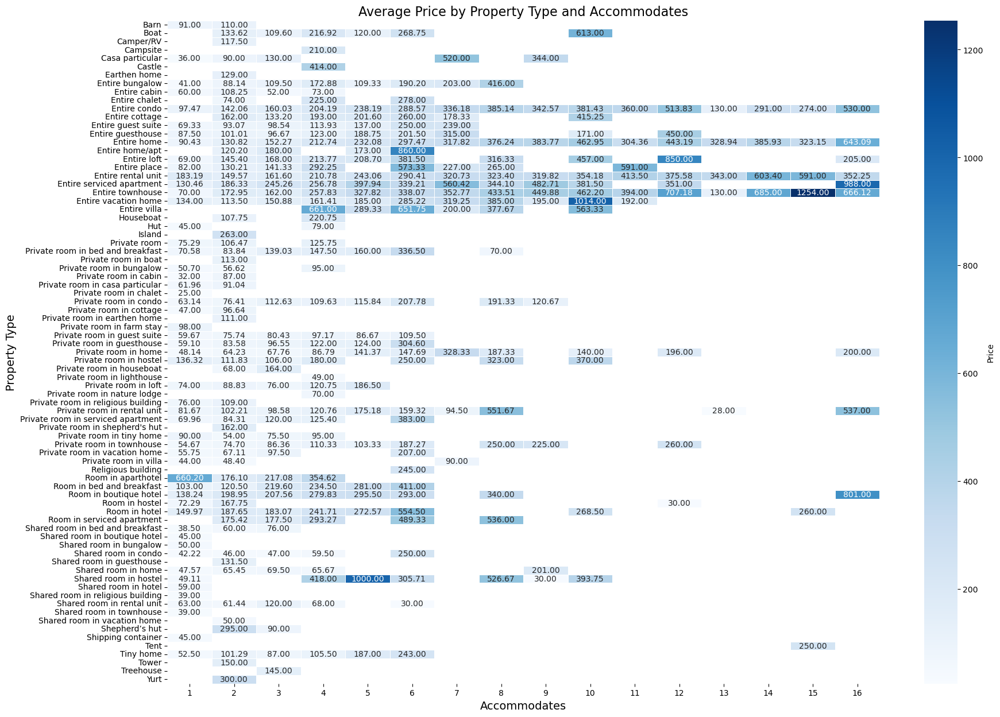

In [34]:

# Create a heatmap with a blue color palette
plt.figure(figsize=(20, 15))
heatmap_data = list_desc.pivot_table(index='property_type', columns='accommodates', values='Price.mod', aggfunc='mean')
sns.heatmap(data=heatmap_data, cmap='Blues',cbar_kws={'label': 'Price'},annot=True, fmt='.2f', linewidths=0.5)

# Customize labels and title
plt.xlabel('Accommodates', fontsize=14)
plt.ylabel('Property Type', fontsize=14)
plt.title('Average Price by Property Type and Accommodates', fontsize=16)

# Show the plot

plt.show()

This graph provides valuable insights into the pricing of different property features, enabling customers to make informed decisions based on their accommodation needs. The heat map compares property types to their prices for varying numbers of occupants, catering to both single travelers and families. Here are some key takeaways from the graph: For Larger Families (5 People or More): The darkest shades of blue indicate higher prices, highlighting that entire vacation homes, townhouses, and service apartments are among the most expensive options. Conversely, shared rooms or private rooms in hostels and villas are more budget-friendly choices, allowing families to save money based on their preferences. For Single Travelers: Those traveling alone and seeking budget-friendly options can opt for shared rooms in townhouses, hostels, or similar accommodations. These choices offer affordability while avoiding more costly options such as rooms in aparthotels or entire rental units. In summary, this heat map proves invaluable in helping individuals identify the most suitable property types based on their accommodation requirements and number of occupants, ensuring they make efficient and cost-effective decisions.

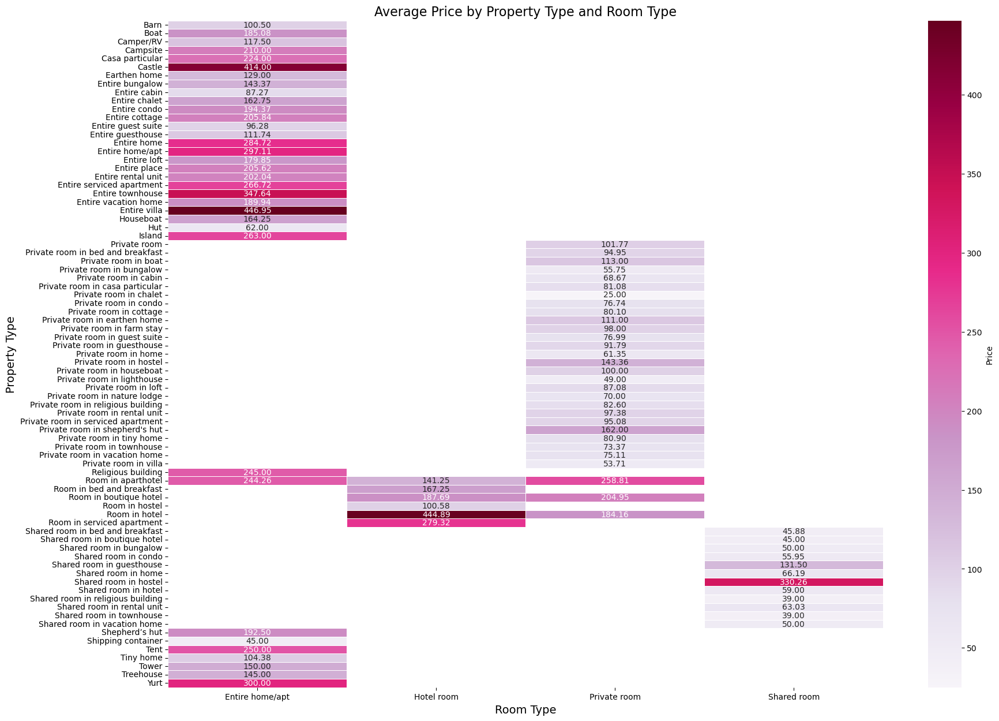

In [35]:
# Create a heatmap with a purple color palette
plt.figure(figsize=(20, 15))
heatmap_data = list_desc.pivot_table(index='property_type', columns='room_type', values='Price.mod', aggfunc='mean')
sns.heatmap(data=heatmap_data, cmap='PuRd', annot=True, fmt='.2f', linewidths=0.5, cbar_kws={'label': 'Price'})

# Customize labels and title
plt.xlabel('Room Type', fontsize=14)
plt.ylabel('Property Type', fontsize=14)
plt.title('Average Price by Property Type and Room Type', fontsize=16)

# Show the plot

plt.show()

The depicted heat map provides a detailed overview of average prices associated with various property and room types. It clearly indicates that opting for a shared room or private room is generally the most economical choice. Specifically, selecting a shared room in a hostel or a private room in a chalet proves to be the most budget-friendly option. Conversely, hotel rooms or entire home/apartment bookings, especially renting out an entire villa or townhouse, tend to be among the most expensive alternatives. This graph serves as a valuable tool for customers making accommodation decisions. It enables them to identify the most cost-effective room types within specific properties. Whether a customer seeks the most budget-friendly option within a particular property or wants to gauge the average price for a specific room type and property category, this information equips them with essential insights for informed booking choices.

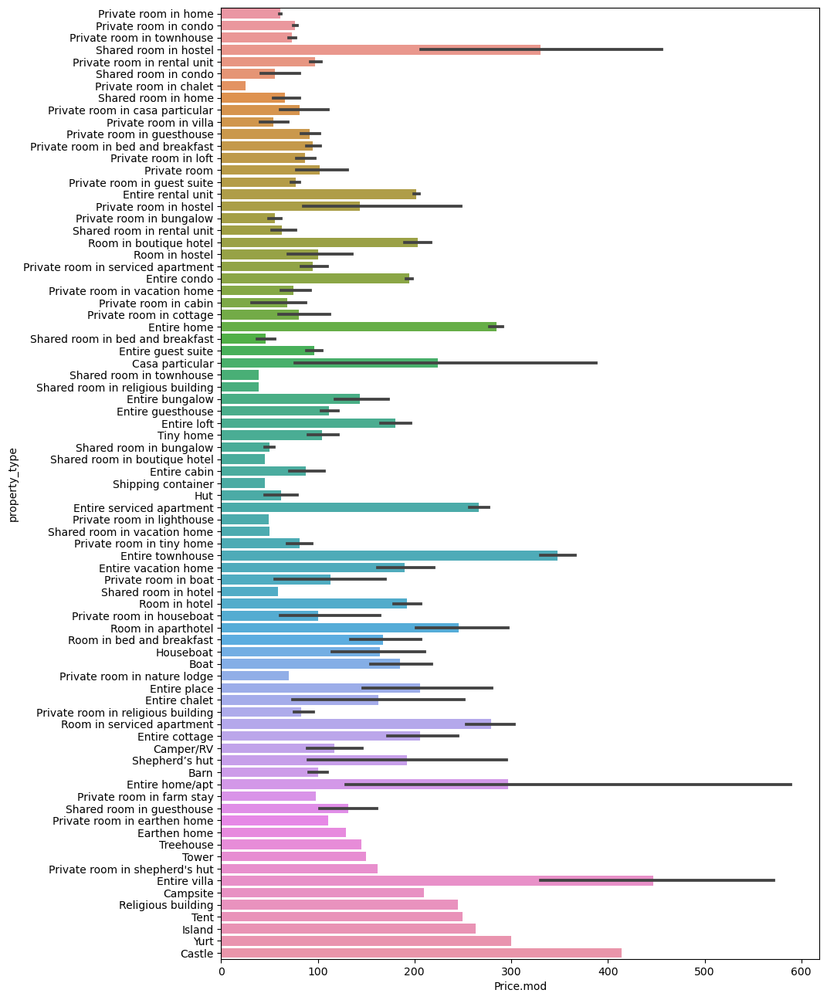

In [36]:
plt.figure(figsize=(10,16))
sns.barplot(x='Price.mod',y='property_type',data=list_desc,orient='h')
plt.show()

This graph merely provides a more general distribution between the different types of properties and their average prices. As you can see, there is a lot of variation in some of the property types, as indicated by the black line, such as in the prices for entire villas and entire homes/apts, we can also see which property types are the most expensive like for example entire villa and least expensive is shared room in hostel which is similar to our previous heat maps. There could be a number of reasons for this variation, such as how the price varies depending on the number of accommodations and whether or not the property is hosted by a superhost. If customers only want to view various property kinds and their average price, this can be helpful.

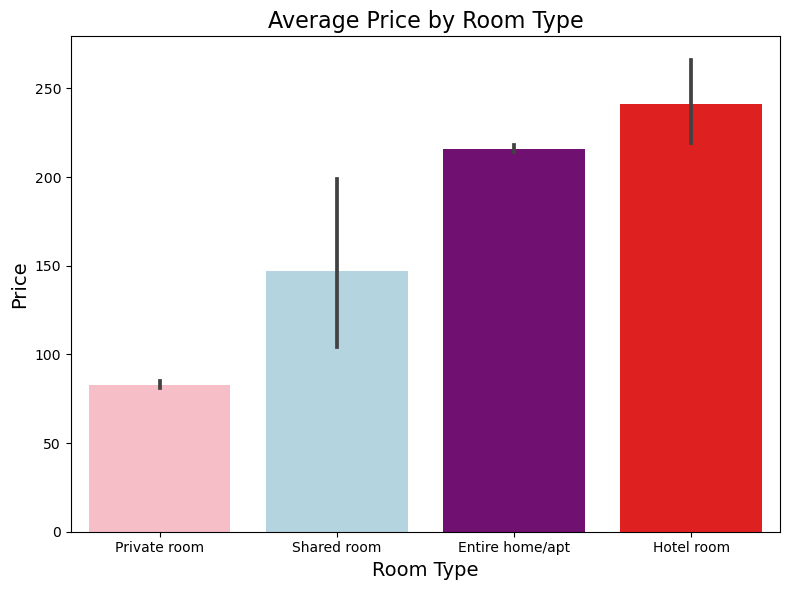

In [37]:
# Set a custom color palette and specify labels for the legend
colors = ['lightpink', 'lightblue', 'purple','red']
sns.set_palette(sns.color_palette(colors))

# Create the bar plot
plt.figure(figsize=(8, 6))
sns.barplot(x='room_type', y='Price.mod', data=list_desc, orient='v')

# Customize labels and title
plt.xlabel('Room Type', fontsize=14)
plt.ylabel('Price', fontsize=14)
plt.title('Average Price by Room Type', fontsize=16)

# Show the plot
plt.tight_layout()
plt.show()

This graph merely provides a more general distribution between the different types of rooms and their average prices. As you can see, there is a lot of variation in some of the graphs, as indicated by the black line, such as in the prices for shared room. There could be a number of reasons for this variation, such as how the price varies depending on the number of accommodations and whether or not the property is hosted by a superhost. If customers only want to view various property kinds and their average price, this can be helpful.

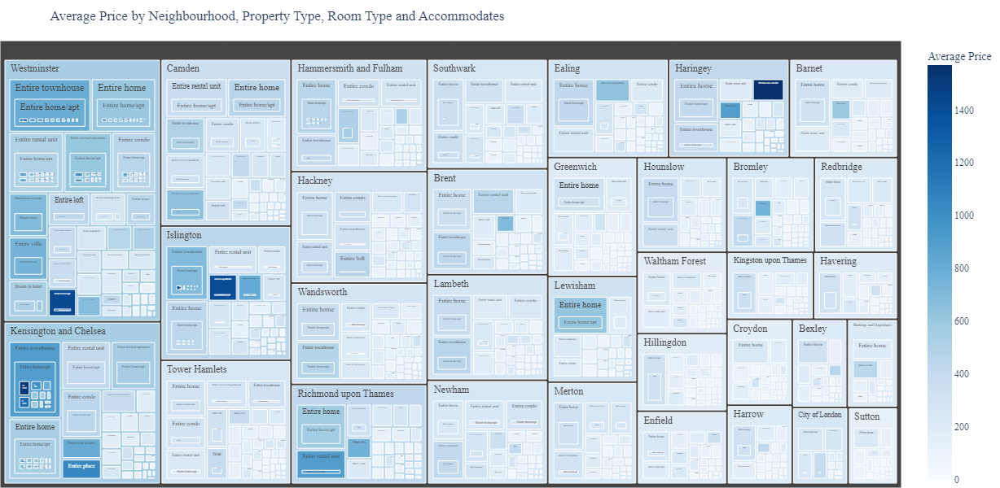

In [43]:

df_agg = list_desc.groupby(['neighbourhood_cleansed','property_type', 'room_type', 'accommodates'])['Price.mod'].mean().reset_index()

df_agg = df_agg[df_agg['Price.mod'].notna() & (df_agg['Price.mod'] != 0)]

fig = px.treemap(
    df_agg,
    path=['neighbourhood_cleansed','property_type', 'room_type', 'accommodates'],
    values='Price.mod',
    color='Price.mod',
    hover_data=['Price.mod'],
    title='Average Price by Neighbourhood, Property Type, Room Type and Accommodates',
    color_continuous_scale='blues', 
    color_continuous_midpoint=df_agg['Price.mod'].mean(),  
    labels={'Price.mod': 'Average Price'}, 
    range_color=[0, df_agg['Price.mod'].max()],  

    width=1000,
    height=600
)

fig.update_traces(textinfo='label+value', selector=dict(type='treemap'))
fig.update_layout(
    margin=dict(l=0, r=0, b=0, t=50), 
    font=dict(family='TimesNewRoman', size=12), 
)

fig.show()


The presented tree map visually represents average prices for distinct unit features such as property type, room type, and number of accommodates across various neighborhoods. This comprehensive visualization allows customers to address specific queries, such as identifying the priciest neighborhood or determining the most affordable property type within a particular area. Whether customers are seeking high-end options or budget-friendly choices, this graph provides precise insights tailored to their specific questions about different neighborhoods and unit features.

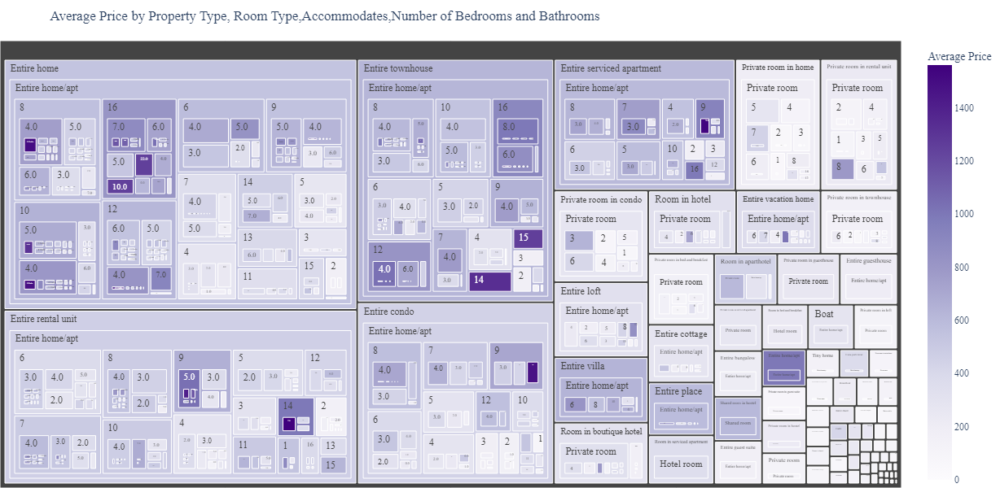

In [44]:

df_agg = list_desc.groupby(['property_type','room_type', 'accommodates', 'bedrooms','bathrooms'])['Price.mod'].mean().reset_index()

df_agg = df_agg[df_agg['Price.mod'].notna() & (df_agg['Price.mod'] != 0)]

fig = px.treemap(
    df_agg,
    path=['property_type','room_type', 'accommodates', 'bedrooms','bathrooms'],
    values='Price.mod',
    color='Price.mod',
    hover_data=['Price.mod'],
    title='Average Price by Property Type, Room Type,Accommodates,Number of Bedrooms and Bathrooms',
    color_continuous_scale='purples',
    color_continuous_midpoint=df_agg['Price.mod'].mean(),
    labels={'Price.mod': 'Average Price'},
    range_color=[0, df_agg['Price.mod'].max()],
    width=1000,
    height=600
)

fig.update_layout(
    margin=dict(l=0, r=0, b=0, t=50), 
    font=dict(family='TimesNewRoman', size=12), 
)


fig.show()


The presented tree map visually represents average prices for distinct unit features such as property type, room type,number of bedrooms and bathrooms and number of accommodates. This comprehensive visualization allows customers to address specific queries, such as identifying for a specific number of bedrooms within a certain room type and property type which is least expensive or what is the average price for certain number of accommodates in different property types. Whether customers are seeking high-end options or budget-friendly choices, this graph provides precise insights tailored to their specific questions about different neighborhoods and unit features.

## Conclusion



In conclusion, our data visualization project on Airbnb in London, England, has provided valuable insights from various perspectives—local, investor, and customer—shedding light on the dynamics of the continually evolving hospitality landscape. Through meticulous analysis, we have discerned key trends and factors influencing decision-making in the realm of temporary housing/AirBnB. Here are the notable findings:
 
1. Tourist Hotspots (Local Perspective):
 By mapping out tourist hotspots in London, we have identified that most listings are in the center of cities as compared to the outskirts of the city which is also where more high-end listings are located. We also noticed that the greatest number of listings seem to be in neighborhoods that have popular tourist attractions, or are nearby the downtown area. Understanding these locations not only benefits tourists seeking immersive experiences but also aids locals in optimizing their property listings based on geographic demand. From our visualizations, a potential tourist to the London area might use the heat maps as a method to either be close to other tourists and stereotypically tourist things, while others might be interested in for a more authentic London experience among locals. Furthermore, for those who live in the London area, who would rather avoid tourists, they could use our heatmaps for the sake of doing so. 
 
2. Factors Affecting Demand of Airbnb Units (Investor's Perspective):
 Our analysis delved into several variables affecting the demand for Airbnb units. Factors such as proximity to popular attractions, public transportation access, and local amenities emerged as crucial determinants. Investors can strategically position their properties by considering these aspects, ensuring a steady flow of demand and occupancy rates. Depending on the preference of the investor or their situation, they might prefer charging more such that they get infrequent, but larger cash injections, or as a steady flow of lower income. For the sake of the investor though, we suggest that they keep a relatively low price point, as they can achieve superhost status and become a trusted individual who can justifiably charge more for their property. 
 
3. Factors Driving Up Prices for Airbnb Units (Customer's Perspective):
 For customers, pricing is a significant consideration. We explored the factors contributing to increased prices, including seasonal variations, special events, and property features. Customers can use this information to plan their stays effectively, taking advantage of periods with lower prices or understanding the premium attached to specific amenities. Furthermore, if an individual can understand which amenities and property aspects have little effects on overall pricing, such that they can understand what might be less of a valuable consideration when booking lodgings.
 
In summary, our project not only provides actionable insights for local residents, investors, and travelers but also underscores the transformative impact of platforms like Airbnb on the hospitality industry. By leveraging data-driven approaches, stakeholders can make informed decisions, enhancing the overall Airbnb experience for hosts and guests alike. As the sharing economy continues to evolve, staying attuned to these insights will be pivotal for adapting to changing demands and maximizing the benefits offered by temporary lodging accommodations.

## References



#### DATA CLEANING AND WRANGLING REFERENCES
https://stackoverflow.com/questions/25669588/convert-percent-string-to-float-in-pandas-read-csv

https://stackoverflow.com/questions/37787698/how-to-sort-pandas-dataframe-from-one-column
https://stackoverflow.com/questions/13413590/how-to-drop-rows-of-pandas-dataframe-whose-value-in-a-certain-column-is-nan
https://www.w3schools.com/python/pandas/pandas_cleaning_empty_cells.asp
https://www.w3schools.com/python/pandas/ref_df_dropna.asp

https://sparkbyexamples.com/pandas/pandas-filter-by-column-value/


https://stackoverflow.com/questions/13413590/how-to-drop-rows-of-pandas-dataframe-whose-value-in-a-certain-column-is-nan
    

#### CUSTOMER'S PERSPECTIVE REFERENCES

Treemap. (n.d.). Retrieved October 16, 2023, from https://plotly.com/python/treemaps/

Pyplot tutorial—Matplotlib 3.8.0 documentation. (n.d.). Retrieved October 16, 2023, from https://matplotlib.org/stable/tutorials/pyplot.html

Seaborn. Barplot—Seaborn 0. 13. 0 documentation. (n.d.). Retrieved October 16, 2023, from https://seaborn.pydata.org/generated/seaborn.barplot.html

DataCamp. (n.d.). WordCloud in Python Tutorial. DataCamp. https://www.datacamp.com/tutorial/wordcloud-python

Seaborn. Heatmap—Seaborn 0. 13. 0 documentation. (n.d.). Retrieved October 16, 2023, from https://seaborn.pydata.org/generated/seaborn.heatmap.html

Shah, R. (2021, May 20). How to build word cloud in python? Analytics Vidhya. https://www.analyticsvidhya.com/blog/2021/05/how-to-build-word-cloud-in-python/


#### INVESTOR'S PERSPECTIVE REFERENCES
Witts, S. (2023, July 20). Sadiq Khan calls for Tougher Regulation on Airbnb in London. The Caterer. https://www.thecaterer.com/news/sadiq-khan-airbnb-london-uk-hospitality  

Yin, T. (2017). Translate. PyPI. https://pypi.org/project/translate/ 

(I never actually used ended up using the above one, I don’t know if you still want to include it) 

Houst. (2023, July 27). The 90-day airbnb rule in London: A guide for homeowners. Leading Airbnb Management Solutions. https://www.houst.com/knowledge/the-90-day-airbnb-rule-and-what-it-means-to-you#:~:text=The%2090%2DDay%20Airbnb%20Rule%20in%20Greater%20London,-%E2%80%8D&text=Once%20your%20limit%20has%20been,days%20spread%20throughout%20the%20year.  

Milidragovic, V. (2018a, November 24). A local’s guide to the neighbourhoods of London. Mapped. https://dailyhive.com/mapped/neighbourhood-guide-london  

Hut, L. (n.d.). The 32 boroughs and the City of London. London Hut. https://www.londonhut.com/p/london-boroughs  

Jaber, D. (2023, October 12). How to buy an airbnb investment property. Learn Real Estate Investing. https://www.mashvisor.com/blog/buy-airbnb-property/  